
<h2 align="center">Experiments</h2> 

Sample input

:Curve   [x]   (y)
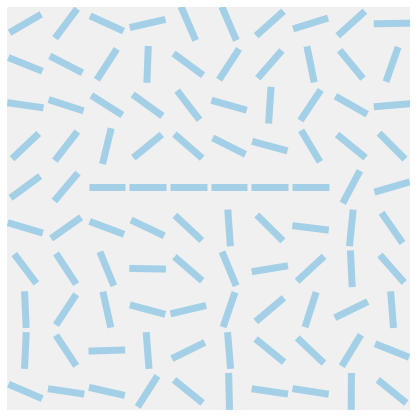

In [4]:
%%output size=200
m = 10
n = 10
ac_orient = np.pi*np.random.rand(m,n)
ac_orient[2:8,5] = 0
visualField(ac_orient)

:HoloMap   [X,Y]
   :Curve   [x]   (y)
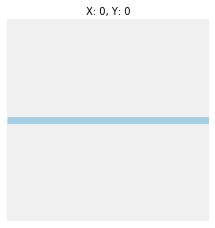
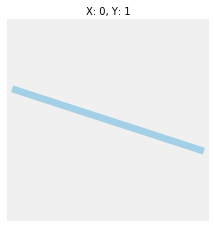
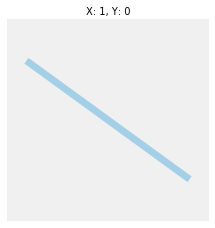
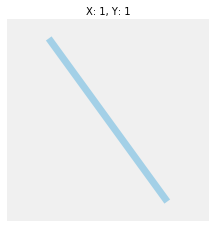
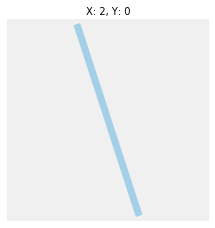
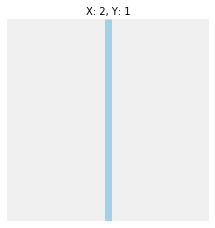
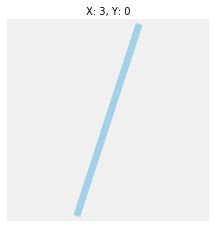
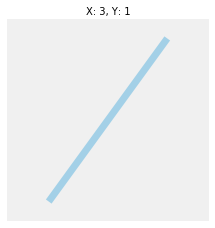
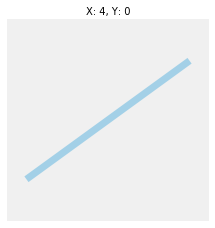
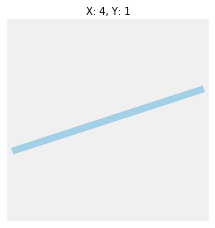

In [21]:
m = 5
n = 2
dimensions = ['X', 'Y']
ac_orient = np.reshape(np.pi*np.arange(m*n)/(m*n), (m,n))
keys = [(i,j) for i in range(m) for j in range(n)]
vf_holomap = hv.HoloMap([(k, visualField(ac_orient[k])) for k in keys], kdims=dimensions)
vf_holomap

In [1]:
# Imports
import math as m
import numpy as np
import matplotlib.pyplot as plt
import holoviews as hv
import pylab as pl
from pylab import exp,cos,sin,pi,tan, pi
import pandas as pd
import seaborn as sb
import holoviews as hv
from IPython.display import SVG
import io
from PIL import Image
from random import random
import elastica as el
import elastica_neurons as en
from dynamics import *
%matplotlib inline
hv.notebook_extension()

/afs/inf.ed.ac.uk/user/s12/s1247380/Documents/HonoursProject/Python/venv/lib/python2.7/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)


:Curve   [x]   (y)
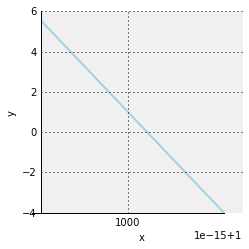

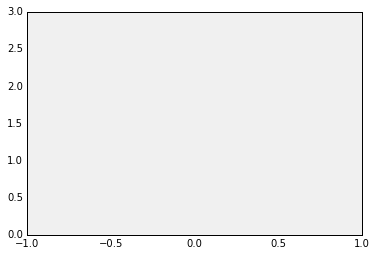

In [13]:
plt.ylim((0,3))
plt.xlim((-1,1))
plotbar(1,1,np.pi/2,l=10)


In [ ]:
max_value = 1
diff = 0.25
magnitudes = [(o1,o2) for o1 in np.arange(0,max_value,diff) for o2 in np.arange(0,np.pi,np.pi/20)]
data = [(conf, populationVisualization(conf)) for conf in magnitudes]
dimensions = ['x1','x2','x3','x4']
sections = hv.HoloMap(data, kdims=dimensions)
sections

Generate weight matrices

We define full connectivity matrices. Every orientation selective neuron from part of the visual field is connected to all other orientation selective neurons from other parts of the visual field. Let's say we have a visual field with size 10x10, with 9 orientation selective neurons for each field. In order to have a full connectivity matrix, we define an mxm matrix, where m=10*10*9. In this way we define the stregth of every neuron to every other neuron. We don't have any connections between neurons in the same part of the visual field. Try to do checks either by visualizing or simple sanity checks. For example we can check if we have setup the correct connection to zero. Number of all connection - 810000, from which 10*10*9*9=8100 should not be connect to each other. When we check that's indeed the case.

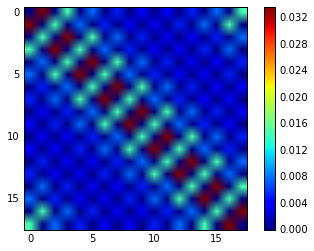

In [65]:
m = 1
n = 2
nosn = 9
distance_scaling = 0.01
orientation_scaling = 0.03
np.size(np.ones((m,n,nosn)))
a = covarianceMatrix(np.ones((m,n,nosn)),distance_scaling,orientation_scaling)
a.shape
plt.imshow(a)
plt.colorbar()
np.save('weight_matrices/1x2x9my.npy', a)

:HoloMap   [T]
   :RGB   [x,y]   (R,G,B,A)
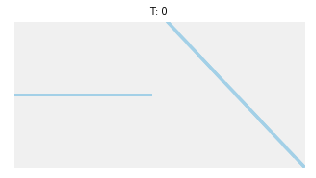
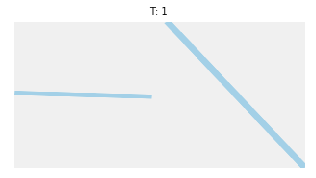
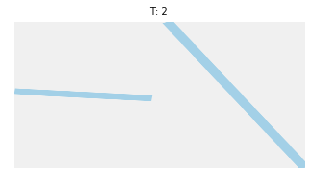
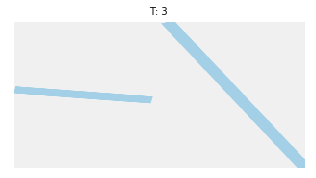
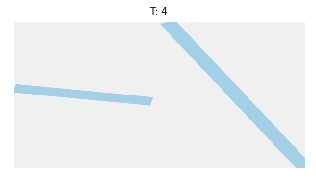
...
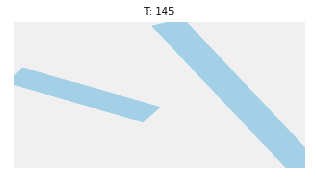
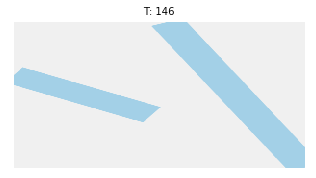
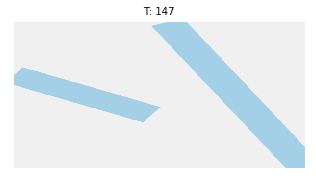
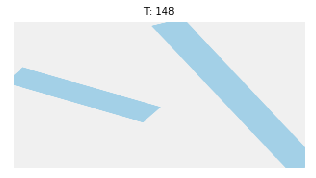
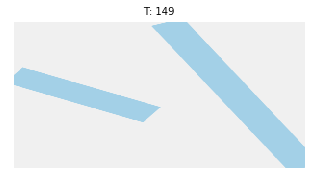

In [66]:
%%output size=150
m = 1
n = 2
tau = 6
# Number of orientation selective neurons
nosn = 9
timesteps = 150
# for vonMises function
k = 0.25
A = 3
# for the weight matrix
distance_scaling = 0.1
orientation_scaling = 0.1
# Set the number of colors for plotting, based on the number of orientation selective neurons
setNumberOfColors(nosn)

orientations = np.arange(0, np.pi, np.pi/nosn)
#ac_orient = np.random.rand(m,n)
responses = np.zeros((nosn, timesteps))
t = np.arange(0,timesteps,1)

spikes_ = vonMises(A,k,ac_orient,orientations)
spikes = spikes_.ravel()
r = np.zeros(len(spikes))
drdt = spikes/tau
rs = np.zeros(spikes.shape + (len(t),))
matrix = np.load('weight_matrices/1x2x9my.npy')
for s in range(len(t)):
    r = r + drdt
    drdt = (-r + spikes)/tau + np.dot(matrix,r)
    rs[:,s] = r

#r_first_neuron = rs[:,1,1,:]
rs = np.reshape(rs, spikes_.shape + (len(t),))
(direction, magnitude) = populationVector(orientations, rs, nosn, timesteps)
dimensions = ['T']
keys = [i for i in range(timesteps)]
oneColor()
r_first_neuron_hm = [(k, visualFieldMagnitude(direction[:,:,k],magnitude[:,:,k], aspect=2)) for k in keys]
sections = hv.HoloMap(r_first_neuron_hm, kdims=dimensions)
sections

:Overlay
   .Points.I    :Points   [x,y]
   .Points.II   :Points   [x,y]
   .Points.III  :Points   [x,y]
   .Points.IV   :Points   [x,y]
   .Points.V    :Points   [x,y]
   .Points.VI   :Points   [x,y]
   .Points.VII  :Points   [x,y]
   .Points.VIII :Points   [x,y]
   .Points.IX   :Points   [x,y]
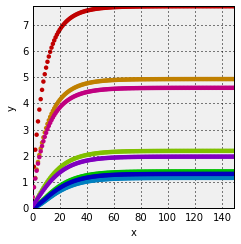

In [67]:
t = np.arange(0,timesteps,1)
setNumberOfColors(nosn)

plotOneField((0,0),t,nosn,rs)

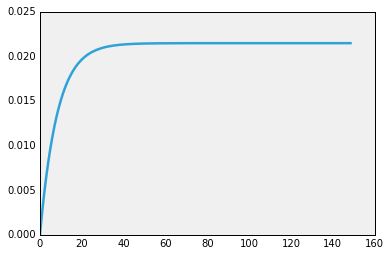

In [70]:
plt.plot(direction[0,0,:])

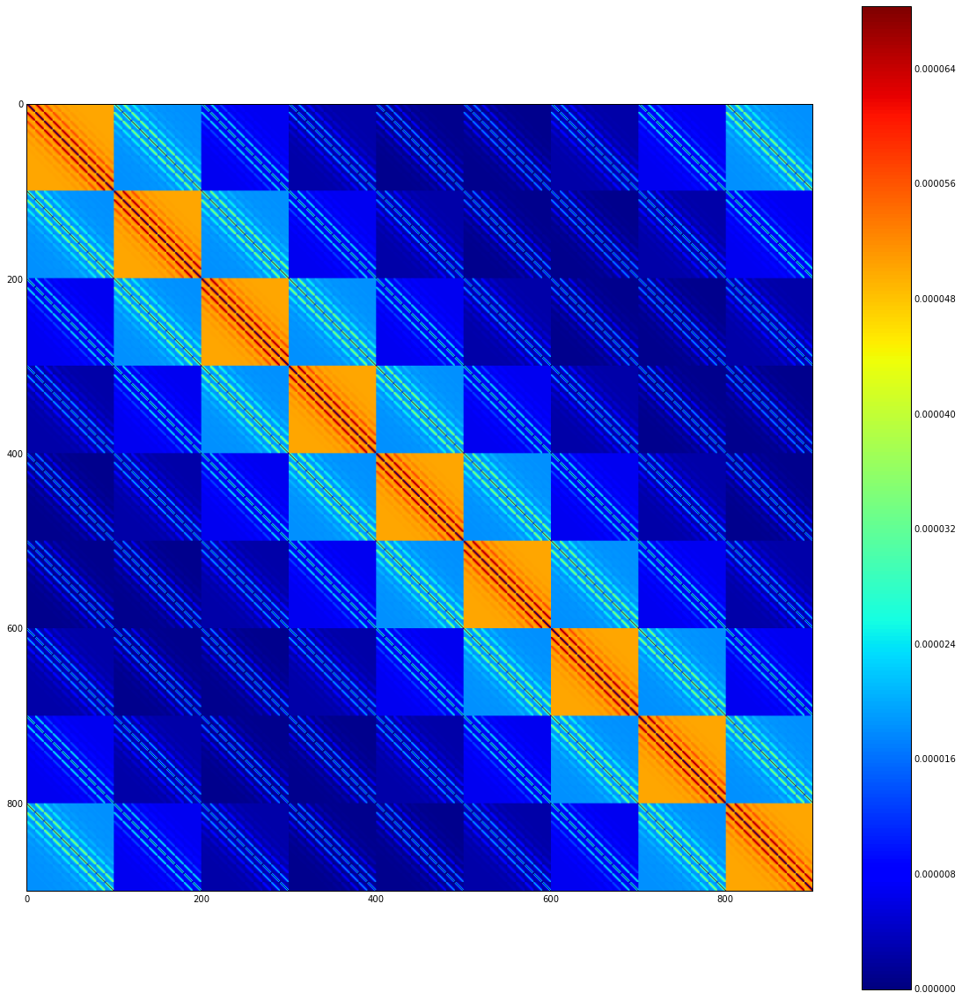

In [18]:
%%output size=300
matrix2 = np.load('weight_matrices/10x10x9my.npy')
plt.figure(figsize=[20, 20])
plt.imshow(matrix2)
plt.colorbar()


In [5]:
matrix = elasticaMatrix(10, 10, 9)
np.save('weight_matrices/10x10x9el.npy', matrix)      

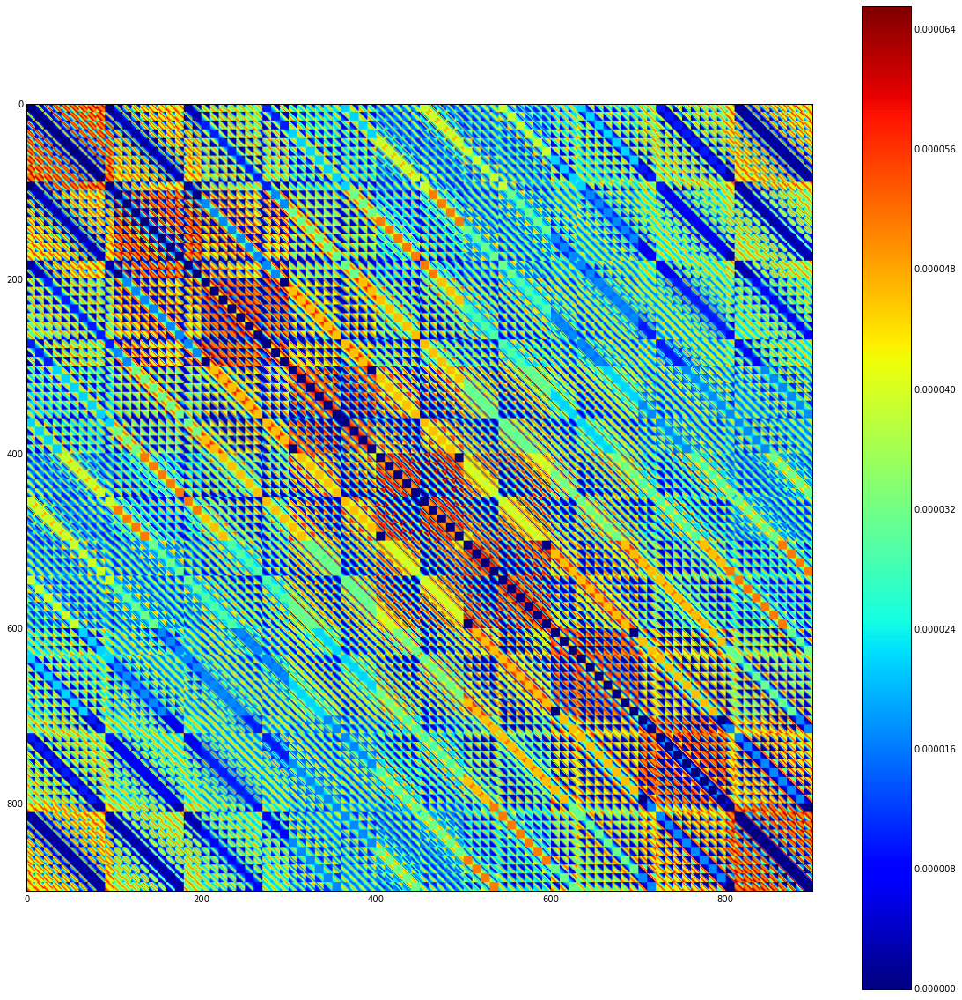

In [6]:
%%output size=300
matrix2 = np.load('weight_matrices/10x10x9el.npy')
matrix2 = matrix2/200000
plt.figure(figsize=[20, 20])
plt.imshow(matrix2)
plt.colorbar()


In [7]:
%%output size=150
m = 10
n = 10
tau = 6
# Number of orientation selective neurons
nosn = 9
timesteps = 10
# for vonMises function
k = 0.25
A = 3
# for the weight matrix
distance_scaling = 0.00005
orientation_scaling = 0.00005
# Set the number of colors for plotting, based on the number of orientation selective neurons
setNumberOfColors(nosn)

orientations = np.arange(0, np.pi, np.pi/nosn)
#ac_orient = np.random.rand(m,n)
responses = np.zeros((nosn, timesteps))
t = np.arange(0,timesteps,1)

spikes_ = vonMises(A,k,ac_orient,orientations)
spikes = spikes_.ravel()
r = np.zeros(len(spikes))
drdt = spikes/tau
rs = np.zeros(spikes.shape + (len(t),))

for s in range(len(t)):
    r = r + drdt
    drdt = (-r + spikes)/tau + np.dot(matrix,r)
    rs[:,s] = r

#r_first_neuron = rs[:,1,1,:]
rs = np.reshape(rs, spikes_.shape + (len(t),))
(direction, magnitude) = populationVector(orientations, rs, nosn, timesteps)
dimensions = ['T']
keys = [i for i in range(timesteps)]
oneColor()
r_first_neuron_hm = [(k, visualFieldMagnitude(direction[:,:,k],magnitude[:,:,k])) for k in keys]
sections = hv.HoloMap(r_first_neuron_hm, kdims=dimensions)
sections

ValueError: shapes (18,18) and (900,) not aligned: 18 (dim 1) != 900 (dim 0)

In [23]:
np.save('weight_matrices/10x10x9my_rs.npy', rs)      

:HoloMap   [T]
   :RGB   [x,y]   (R,G,B,A)
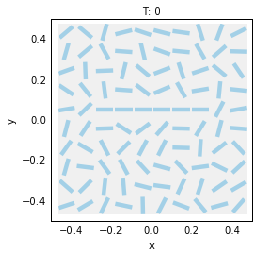
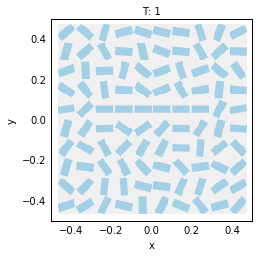
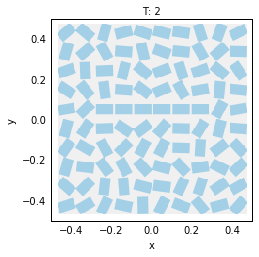
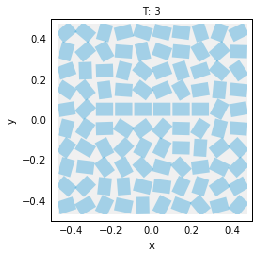
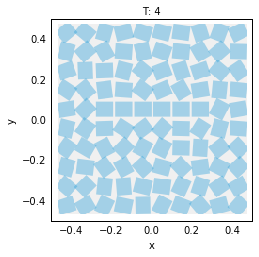
...
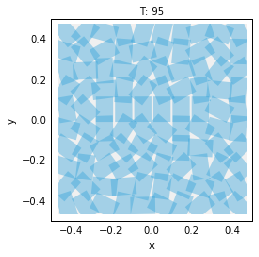
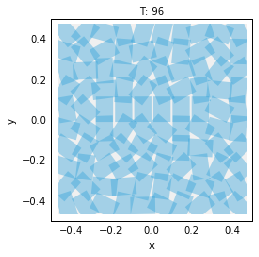
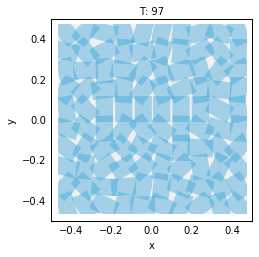
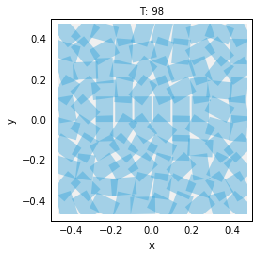
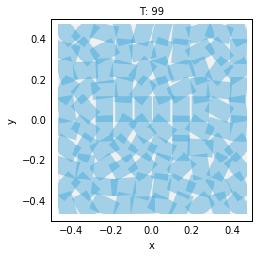

In [7]:
#r_first_neuron = rs[:,1,1,:]
m = 10
n = 10
tau = 6
timesteps = 100
# Number of orientation selective neurons
nosn = 9
orientations = np.arange(0, np.pi, np.pi/nosn)

rs = np.load('weight_matrices/10x10x9my_rs.npy')      
(direction, magnitude) = populationVector(orientations, rs, nosn, timesteps)
dimensions = ['T']
keys = [i for i in range(timesteps)]
oneColor()
r_first_neuron_hm = [(k, visualFieldMagnitude(direction[:,:,k],magnitude[:,:,k])) for k in keys]
sections = hv.HoloMap(r_first_neuron_hm, kdims=dimensions)
sections

:Overlay
   .Points.I    :Points   [x,y]
   .Points.II   :Points   [x,y]
   .Points.III  :Points   [x,y]
   .Points.IV   :Points   [x,y]
   .Points.V    :Points   [x,y]
   .Points.VI   :Points   [x,y]
   .Points.VII  :Points   [x,y]
   .Points.VIII :Points   [x,y]
   .Points.IX   :Points   [x,y]
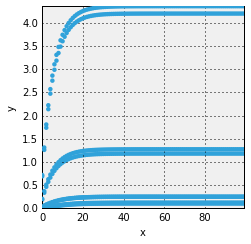

In [10]:
t = np.arange(0,timesteps,1)

plotOneField((1,0),t,nosn,rs)

:HoloMap   [T]
   :Overlay
      .Curve.I        :Curve   [x]   (y)
      .Curve.II       :Curve   [x]   (y)
      .Curve.III      :Curve   [x]   (y)
      .Curve.IV       :Curve   [x]   (y)
      .Curve.V        :Curve   [x]   (y)
      .Curve.VI       :Curve   [x]   (y)
      .Curve.VII      :Curve   [x]   (y)
      .Curve.VIII     :Curve   [x]   (y)
      .Curve.IX       :Curve   [x]   (y)
      .Curve.X        :Curve   [x]   (y)
      .Curve.XI       :Curve   [x]   (y)
      .Curve.XII      :Curve   [x]   (y)
      .Curve.XIII     :Curve   [x]   (y)
      .Curve.XIV      :Curve   [x]   (y)
      .Curve.XV       :Curve   [x]   (y)
      .Curve.XVI      :Curve   [x]   (y)
      .Curve.XVII     :Curve   [x]   (y)
      .Curve.XVIII    :Curve   [x]   (y)
      .Curve.XIX      :Curve   [x]   (y)
      .Curve.XX       :Curve   [x]   (y)
      .Curve.XXI      :Curve   [x]   (y)
      .Curve.XXII     :Curve   [x]   (y)
      .Curve.XXIII    :Curve   [x]   (y)
      .Curve.XXIV     :Curve   [x]   (y)
      .Curve.XXV      :Curve   [x]   (y)
      .Curve.XXVI     :Curve   [x]   (y)
      .Curve.XXVII    :Curve   [x]   (y)
      .Curve.XXVIII   :Curve   [x]   (y)
      .Curve.XXIX     :Curve   [x]   (y)
      .Curve.XXX      :Curve   [x]   (y)
      .Curve.XXXI     :Curve   [x]   (y)
      .Curve.XXXII    :Curve   [x]   (y)
      .Curve.XXXIII   :Curve   [x]   (y)
      .Curve.XXXIV    :Curve   [x]   (y)
      .Curve.XXXV     :Curve   [x]   (y)
      .Curve.XXXVI    :Curve   [x]   (y)
      .Curve.XXXVII   :Curve   [x]   (y)
      .Curve.XXXVIII  :Curve   [x]   (y)
      .Curve.XXXIX    :Curve   [x]   (y)
      .Curve.XL       :Curve   [x]   (y)
      .Curve.XLI      :Curve   [x]   (y)
      .Curve.XLII     :Curve   [x]   (y)
      .Curve.XLIII    :Curve   [x]   (y)
      .Curve.XLIV     :Curve   [x]   (y)
      .Curve.XLV      :Curve   [x]   (y)
      .Curve.XLVI     :Curve   [x]   (y)
      .Curve.XLVII    :Curve   [x]   (y)
      .Curve.XLVIII   :Curve   [x]   (y)
      .Curve.XLIX     :Curve   [x]   (y)
      .Curve.L        :Curve   [x]   (y)
      .Curve.LI       :Curve   [x]   (y)
      .Curve.LII      :Curve   [x]   (y)
      .Curve.LIII     :Curve   [x]   (y)
      .Curve.LIV      :Curve   [x]   (y)
      .Curve.LV       :Curve   [x]   (y)
      .Curve.LVI      :Curve   [x]   (y)
      .Curve.LVII     :Curve   [x]   (y)
      .Curve.LVIII    :Curve   [x]   (y)
      .Curve.LIX      :Curve   [x]   (y)
      .Curve.LX       :Curve   [x]   (y)
      .Curve.LXI      :Curve   [x]   (y)
      .Curve.LXII     :Curve   [x]   (y)
      .Curve.LXIII    :Curve   [x]   (y)
      .Curve.LXIV     :Curve   [x]   (y)
      .Curve.LXV      :Curve   [x]   (y)
      .Curve.LXVI     :Curve   [x]   (y)
      .Curve.LXVII    :Curve   [x]   (y)
      .Curve.LXVIII   :Curve   [x]   (y)
      .Curve.LXIX     :Curve   [x]   (y)
      .Curve.LXX      :Curve   [x]   (y)
      .Curve.LXXI     :Curve   [x]   (y)
      .Curve.LXXII    :Curve   [x]   (y)
      .Curve.LXXIII   :Curve   [x]   (y)
      .Curve.LXXIV    :Curve   [x]   (y)
      .Curve.LXXV     :Curve   [x]   (y)
      .Curve.LXXVI    :Curve   [x]   (y)
      .Curve.LXXVII   :Curve   [x]   (y)
      .Curve.LXXVIII  :Curve   [x]   (y)
      .Curve.LXXIX    :Curve   [x]   (y)
      .Curve.LXXX     :Curve   [x]   (y)
      .Curve.LXXXI    :Curve   [x]   (y)
      .Curve.LXXXII   :Curve   [x]   (y)
      .Curve.LXXXIII  :Curve   [x]   (y)
      .Curve.LXXXIV   :Curve   [x]   (y)
      .Curve.LXXXV    :Curve   [x]   (y)
      .Curve.LXXXVI   :Curve   [x]   (y)
      .Curve.LXXXVII  :Curve   [x]   (y)
      .Curve.LXXXVIII :Curve   [x]   (y)
      .Curve.LXXXIX   :Curve   [x]   (y)
      .Curve.XC       :Curve   [x]   (y)
      .Curve.XCI      :Curve   [x]   (y)
      .Curve.XCII     :Curve   [x]   (y)
      .Curve.XCIII    :Curve   [x]   (y)
      .Curve.XCIV     :Curve   [x]   (y)
      .Curve.XCV      :Curve   [x]   (y)
      .Curve.XCVI     :Curve   [x]   (y)
      .Curve.XCVII    :Curve   [x]   
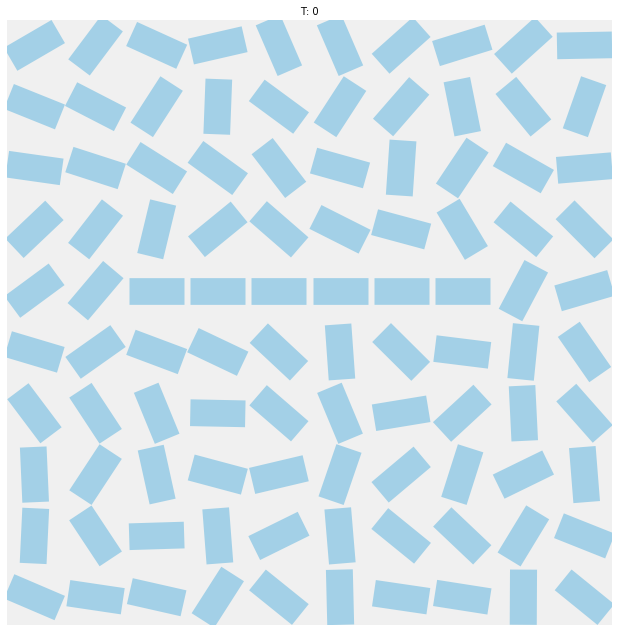
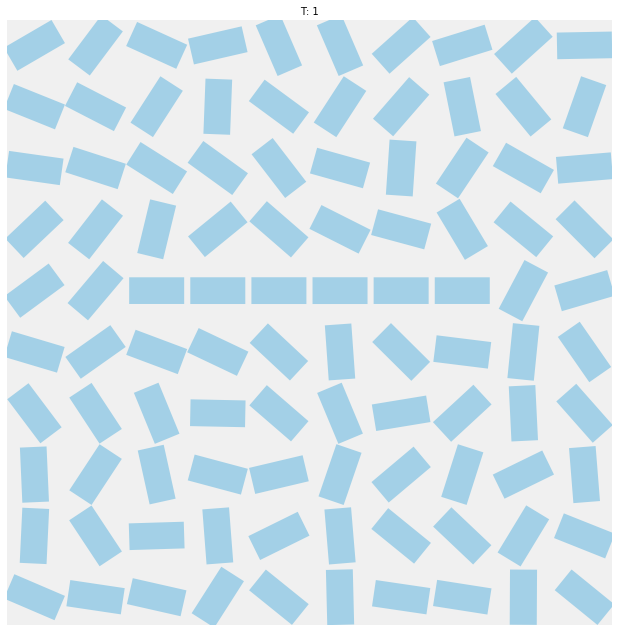
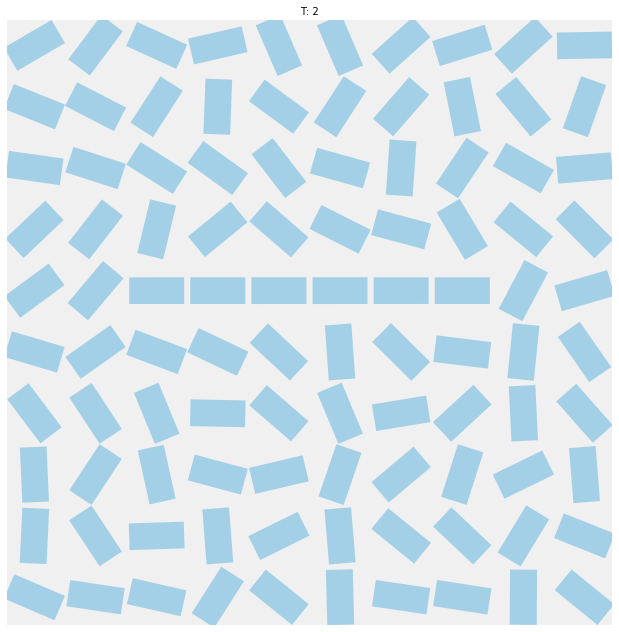
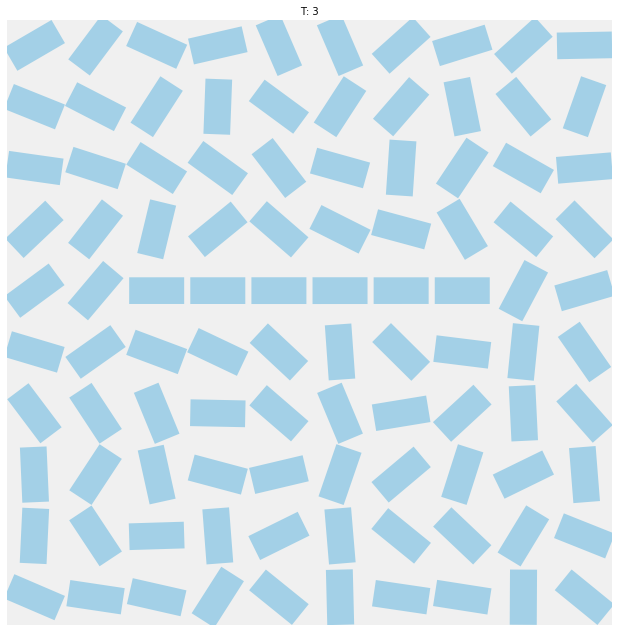
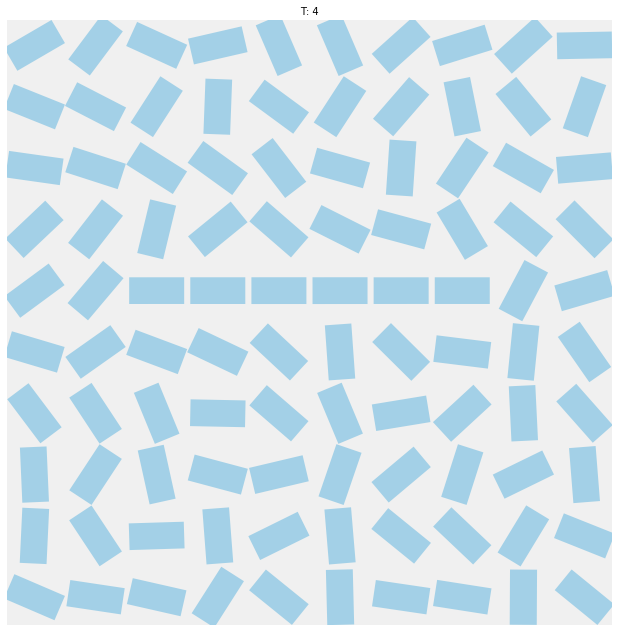
...
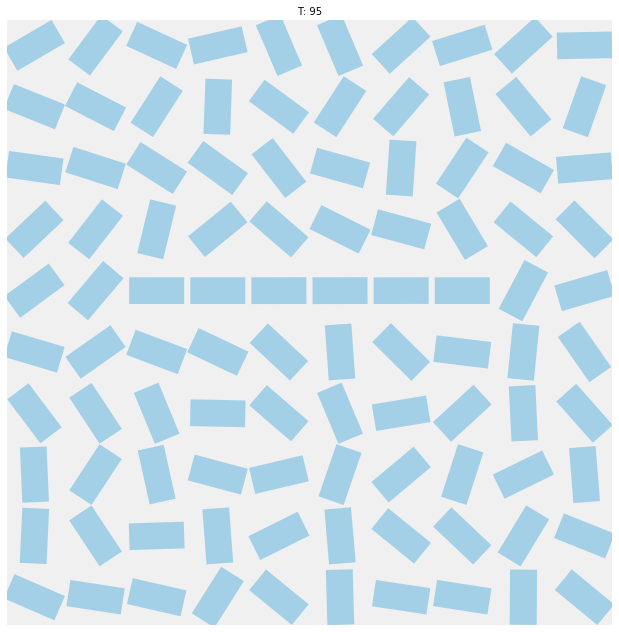
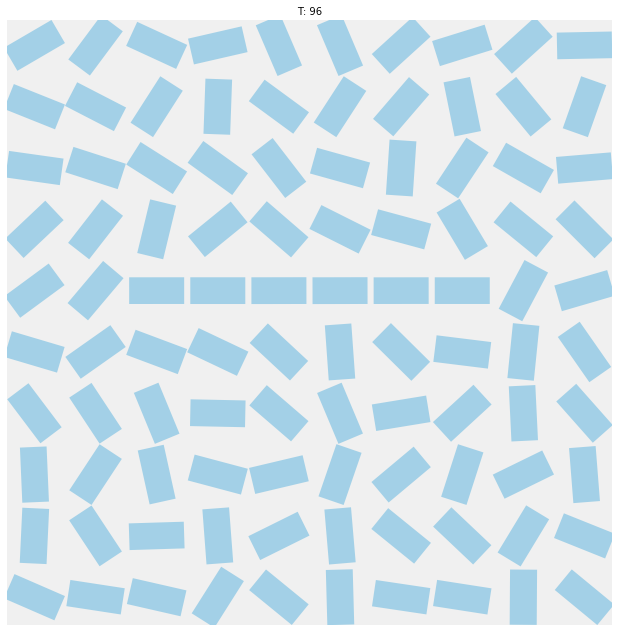
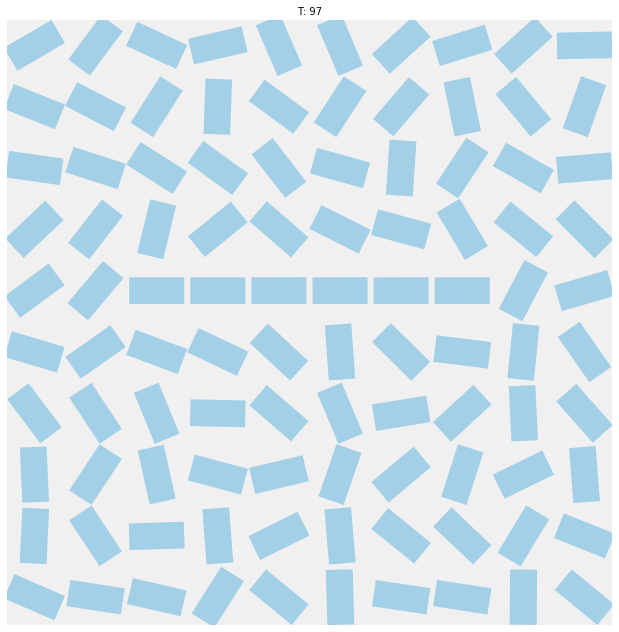
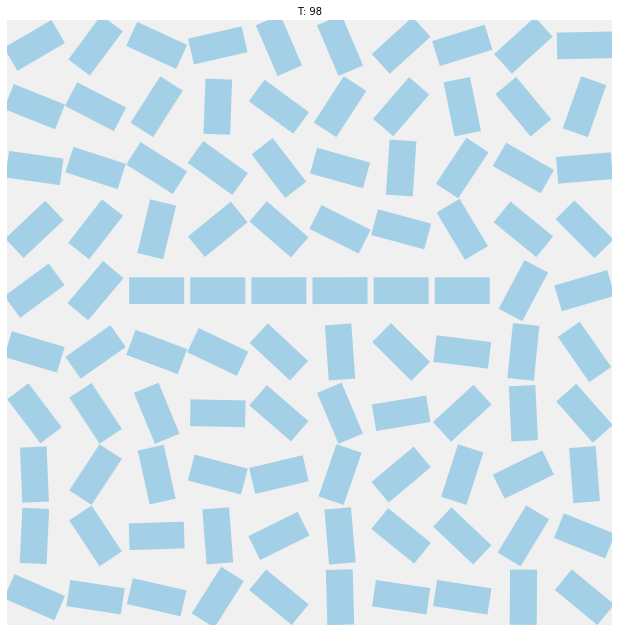
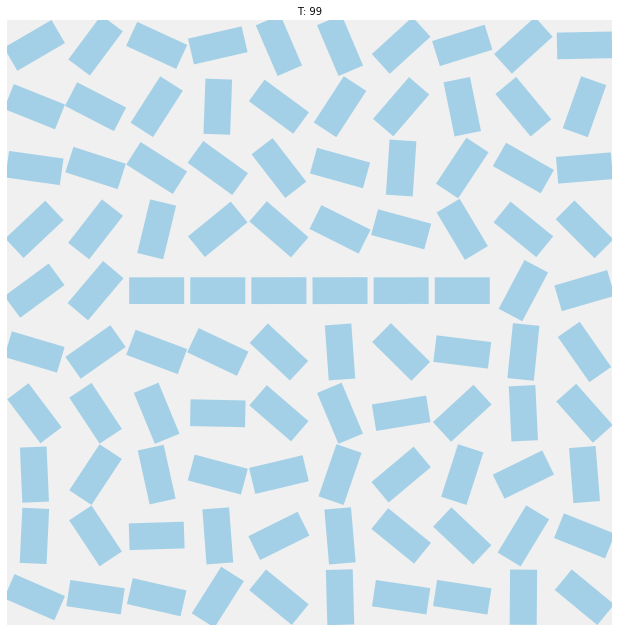

In [8]:
%%output size=300
m = 10
n = 10
tau = 6
# Number of orientation selective neurons
nosn = 9
timesteps = 100
# for vonMises function
k = 0.25
A = 3
# for the weight matrix
distance_scaling = 0.00005
orientation_scaling = 0.00005
# Set the number of colors for plotting, based on the number of orientation selective neurons
setNumberOfColors(nosn)

orientations = np.arange(0, np.pi, np.pi/nosn)
#ac_orient = np.random.rand(m,n)
responses = np.zeros((nosn, timesteps))
t = np.arange(0,timesteps,1)

spikes_ = vonMises(A,k,ac_orient,orientations)
spikes = spikes_.ravel()
r = np.zeros(len(spikes))
drdt = spikes/tau
rs = np.zeros(spikes.shape + (len(t),))

for s in range(len(t)):
    r = r + drdt
    drdt = (-r + spikes)/tau + np.dot(matrix2,r)
    rs[:,s] = r

#r_first_neuron = rs[:,1,1,:]
rs = np.reshape(rs, spikes_.shape + (len(t),))
(direction, magnitude) = populationVector(orientations, rs, nosn, timesteps)
dimensions = ['T']
keys = [i for i in range(timesteps)]
oneColor()
r_first_neuron_hm = [(k, visualFieldMagnitude(direction[:,:,k],magnitude[:,:,k])) for k in keys]
sections = hv.HoloMap(r_first_neuron_hm, kdims=dimensions)
sections

:Overlay
   .Points.I    :Points   [x,y]
   .Points.II   :Points   [x,y]
   .Points.III  :Points   [x,y]
   .Points.IV   :Points   [x,y]
   .Points.V    :Points   [x,y]
   .Points.VI   :Points   [x,y]
   .Points.VII  :Points   [x,y]
   .Points.VIII :Points   [x,y]
   .Points.IX   :Points   [x,y]
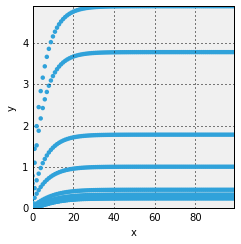

In [14]:
t = np.arange(0,timesteps,1)

plotOneField((5,3),t,nosn,rs)